In [ ]:
# mount Google Drive
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [ ]:
# read a file
gdrive_path = '/content/drive/MyDrive/Thesis2/'

In [ ]:
# Downloading necessary packages
!pip install emoji
!pip install spacy
!pip install tensorflow
!pip install cleantext
!pip install seaborn
!pip install nltk

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 431.4/431.4 kB 6.2 MB/s eta 0:00:00


In [ ]:
#import necessary library
import numpy as np
import string
import emoji
import re
import nltk
import pandas as pd
import pickle
import gensim
import time
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf

from sklearn.model_selection import train_test_split
from textblob import TextBlob
from nltk.corpus import wordnet
from nltk.corpus import stopwords
from nltk.metrics import edit_distance
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import word_tokenize
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from collections import Counter
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Keras
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense, Dropout, Embedding, Flatten, Conv1D, MaxPooling1D, LSTM, Bidirectional
from tensorflow.keras import utils
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

In [ ]:
import nltk
nltk.download('all')
nltk.download('stopwords')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/abc.zip.
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/alpino.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_eng to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping
[nltk_data]    |       taggers/averaged_perceptron_tagger_eng.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping
[nltk_data]    |       taggers/averaged_perceptron_tagger_ru.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_rus to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |  

True

In [ ]:
import glob
import pandas as pd
raw_coffee_path = '/content/drive/MyDrive/Thesis2/raw_reviews'
file_list = glob.glob(raw_coffee_path + "/*.xlsx")
excl_list = []

for file in file_list:
    excl_list.append(pd.read_excel(file))

excl_merged = pd.concat(excl_list, ignore_index=True)

excl_merged.to_excel(f"{gdrive_path}coffee_shops_reviews.xlsx", index=False)

In [ ]:
#read the reviews
import pandas as pd
df = pd.read_excel(f"{gdrive_path}coffee_shops_reviews.xlsx")
df

,state,title,categoryName,website,url,reviewsCount,stars,text
0,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,NaN,https://www.google.com/maps/search/?api=1&quer...,375,3.0,Long waiting time even at no rush hour. Wait f...
1,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,NaN,https://www.google.com/maps/search/?api=1&quer...,375,4.0,Nice place for a hangout and have a sip of cof...
2,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,NaN,https://www.google.com/maps/search/?api=1&quer...,375,5.0,A hidden gem in Chinatown Kuala Terengganu. Co...
3,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,NaN,https://www.google.com/maps/search/?api=1&quer...,375,3.0,"Balek Kg Cina, discovered this cafe from my fr..."
4,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,NaN,https://www.google.com/maps/search/?api=1&quer...,375,5.0,Was walking to search for this Hidden Cafe and...
...,...,...,...,...,...,...,...,...
137557,Selangor,Empty Cup Coffee Roastery,Cafe,NaN,https://www.google.com/maps/search/?api=1&quer...,457,5.0,NaN
137558,Selangor,Empty Cup Coffee Roastery,Cafe,NaN,https://www.google.com/maps/search/?api=1&quer...,457,4.0,NaN
137559,Selangor,Empty Cup Coffee Roastery,Cafe,NaN,https://www.google.com/maps/search/?api=1&quer...,457,1.0,不怎么样
137560,Selangor,Empty Cup Coffee Roastery,Cafe,NaN,https://www.google.com/maps/search/?api=1&quer...,457,5.0,NaN


In [ ]:
df.dtypes

state            object
title            object
categoryName     object
website          object
url              object
reviewsCount      int64
stars           float64
text             object
dtype: object

In [ ]:
!pip install langid

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 9.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langid: filename=langid-1.1.6-py3-none-any.whl size=1941172 sha256=aac1d8fb8e5391a7e83de5065588fabdd5861a24a6ddd6b1d722e757a71aad52
  Stored in directory: /root/.cache/pip/wheels/23/c8/c6/eed80894918490a175677414d40bd7c851413bbe03d4856c3c
Successfully built langid


In [ ]:
import pandas as pd
import langid

# List of categories to keep
valid_categories = ["Cafe", "Coffee shop", "Breakfast restaurant", "Brunch restaurant", "Coffee stand",
                    "Coffee store", "Coffee roasters", "Bistro", "Patisserie", "Espresso bar", "Art cafe"]

# Filter out non-valid_categories and empty reviews
df = df[(df['categoryName'].isin(valid_categories)) &
        (df['text'].notna()) &
        (df['text'] != '')]

# Remove the "Website", "googlemap url", and "reviewsCount" columns
df = df.drop(['website', 'url', 'reviewsCount'], axis=1)

# Remove rows with NaN values in the "stars" column
df = df.dropna(subset=['stars'])

# Filter out non-English text
def is_english(text):
    lang, _ = langid.classify(text)
    return lang == 'en'

df = df[df['text'].apply(is_english)]

# Rename the 'text' column to 'review'
df = df.rename(columns={'text': 'review'})

df


,state,title,categoryName,stars,review
0,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,3.0,Long waiting time even at no rush hour. Wait f...
1,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,4.0,Nice place for a hangout and have a sip of cof...
2,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,5.0,A hidden gem in Chinatown Kuala Terengganu. Co...
3,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,3.0,"Balek Kg Cina, discovered this cafe from my fr..."
4,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,5.0,Was walking to search for this Hidden Cafe and...
...,...,...,...,...,...
137518,Selangor,Empty Cup Coffee Roastery,Cafe,5.0,Coffee House
137519,Selangor,Empty Cup Coffee Roastery,Cafe,4.0,Nice cuppa.
137520,Selangor,Empty Cup Coffee Roastery,Cafe,5.0,The atmosphere is soooo relaxing. Perfect burn...
137521,Selangor,Empty Cup Coffee Roastery,Cafe,5.0,Great coffee


In [ ]:
df = pd.read_excel(f"{gdrive_path}filtered_coffee_shops_reviews.xlsx")

# Define the label function
def labelFunc(x):
    if int(x) > 3:
        return "positive"
    else:
        return "negative"

# Add sentiment label
df["sentiment"] = df["stars"].apply(labelFunc)
df['label'] = df['sentiment'].replace(['positive', 'negative'], ['1', '0'])

# Rename the 'text' column to 'review'
df = df.rename(columns={'text': 'review'})

# Save the DataFrame with sentiment labels to a new Excel file
df.to_excel(f"{gdrive_path}Coffee_shops_reviews_with_Sentiment.xlsx", index=False)
df

,state,title,categoryName,stars,review,sentiment,label
0,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,3,Long waiting time even at no rush hour. Wait f...,negative,0
1,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,4,Nice place for a hangout and have a sip of cof...,positive,1
2,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,5,A hidden gem in Chinatown Kuala Terengganu. Co...,positive,1
3,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,3,"Balek Kg Cina, discovered this cafe from my fr...",negative,0
4,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,5,Was walking to search for this Hidden Cafe and...,positive,1
...,...,...,...,...,...,...,...
99957,Selangor,Empty Cup Coffee Roastery,Cafe,5,Good piccolo latte,positive,1
99958,Selangor,Empty Cup Coffee Roastery,Cafe,5,那里的美食真好吃,positive,1
99959,Selangor,Empty Cup Coffee Roastery,Cafe,3,Gud taste,negative,0
99960,Selangor,Empty Cup Coffee Roastery,Cafe,4,Good hợp khẩu vị,positive,1


In [ ]:
import pandas as pd
import numpy as np

# Select 5k positive and 5k negative samples randomly
positive_samples = df[df['label'] == '1'].sample(n=5000, random_state=42)
negative_samples = df[df['label'] == '0'].sample(n=5000, random_state=42)

# Concatenate the samples
random_10k_reviews = pd.concat([positive_samples, negative_samples], ignore_index=True)

# Save the randomly selected samples to a new excel file
random_10k_reviews.to_excel(f"{gdrive_path}random_10k_reviews.xlsx", index=False)


In [ ]:
df = pd.read_excel(f"{gdrive_path}random_10k_reviews.xlsx")
df.head()

,state,title,categoryName,stars,review,sentiment,label
0,Kuala Lumpur,Gigi Coffee (Pavilion KL),Coffee shop,5,They have coffee beans from 2 major growing re...,positive,1
1,Kuala Lumpur,Lisette's Café & Bakery @ Bangsar,Cafe,4,Perfect brunch with pastry. Perfect atmosphere...,positive,1
2,Kedah,AORORA,Cafe,4,Went there after iftar. Arrived at 8.45pm but ...,positive,1
3,Perak,Six Half Coffee,Coffee shop,5,Good place to relax,positive,1
4,Kedah,Coffee Tree & Coffee Tree Boutique,Coffee shop,5,A very popular place among foreign tourists wh...,positive,1


In [ ]:
df = pd.read_csv(f"{gdrive_path}IMDB Dataset.csv")

df['label'] = df['sentiment'].replace(['positive', 'negative'],['1', '0'])
df.to_csv(f"{gdrive_path}IMDB_Dataset_label.csv")

df.head()

,review,sentiment,label
0,One of the other reviewers has mentioned that ...,positive,1
1,A wonderful little production. <br /><br />The...,positive,1
2,I thought this was a wonderful way to spend ti...,positive,1
3,Basically there's a family where a little boy ...,negative,0
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive,1


In [ ]:
import pandas as pd

# Load IMDb reviews dataset
imdb_df = pd.read_csv(f"{gdrive_path}IMDB_Dataset_label.csv")

# Load coffee shop reviews dataset
coffee_df = pd.read_excel(f"{gdrive_path}random_10k_reviews.xlsx")

imdb_reviews = imdb_df[['review', 'sentiment', 'label']]
coffee_reviews = coffee_df[['review', 'sentiment', 'label']]

# Merge the reviews
merged_reviews = pd.concat([imdb_reviews, coffee_reviews], ignore_index=True)

# Save the merged reviews to a new CSV file
merged_reviews.to_csv(f"{gdrive_path}merged_reviews.csv", index=False)


In [ ]:
df = pd.read_csv(f"{gdrive_path}merged_reviews.csv")
df

,review,sentiment,label
0,One of the other reviewers has mentioned that ...,positive,1
1,A wonderful little production. <br /><br />The...,positive,1
2,I thought this was a wonderful way to spend ti...,positive,1
3,Basically there's a family where a little boy ...,negative,0
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive,1
...,...,...,...
59995,"Ordered iced coffee, brioche toast, and fish b...",negative,0
59996,Pros:\n- spacious\n- strong wifi if you really...,negative,0
59997,Food is tasty and big portion.the coffee also ...,negative,0
59998,Weirdly stressed waitress. Owner was there and...,negative,0


In [ ]:
# spacy for lemmatization
import spacy
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

#load English stopwords
stopwords = nltk.corpus.stopwords.words('english')

# preprocessing function
def preprocess(text):

    # Generate a list of words
    text_blob = TextBlob(text)
    text = ' '.join(text_blob.words)

    # Remove number
    text = re.sub(r'[0-9]', '', text)

    # Convert to lowercase
    text = text.lower()

    # Convert emoji to text
    text = emoji.demojize(text)

    #Remove punctuation
    for punctuation in string.punctuation:
        text = text.replace(punctuation, '')

    # Tokenize the text
    text = word_tokenize(text)

    # Remove empty token
    text = [t for t in text if len(t) > 0]

    # Remove non-alphabetical token
    text = [t for t in text if t.isalpha()]

    # Replace the negation token
    replacer  = AntonymReplacer()
    text = replacer.replace_negations(text)

    # Remove the stopwords
    text = [i for i in text if i not in stopwords]

    # Stemming
    #porter_stemmer = PorterStemmer()
    #text = [porter_stemmer.stem(w) for w in text]

    # Lemmatization
    text = lemmatization(text, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

    return text

# Lemmetization function
def lemmatization(sent, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    doc = nlp(" ".join(sent))
    texts_out = [token.lemma_ for token in doc if token.pos_ in allowed_postags]
    return texts_out

# Class for replacing antonyms
class AntonymReplacer(object):
    def replace(self, word, pos=None):
        antonyms = set()

        # Find antonyms using wordnet
        for syn in wordnet.synsets(word, pos=pos):
            for lemma in syn.lemmas():
                for antonym in lemma.antonyms():
                    antonyms.add(antonym.name())

        # Return the antonym if only one is found
        if len(antonyms) == 1:
            return antonyms.pop()
        else:
            return None

    # Replace negation in sentence
    def replace_negations(self, sent):
        i, l = 0, len(sent)
        words = []

        while i < l:
            word = sent[i]

            if word == 'not' and i+1 < l:
                ant = self.replace(sent[i+1])

                if ant:
                    words.append(ant)
                    i += 2
                    continue

            words.append(word)
            i += 1

        return words

**SVM using CountVectorizer**

In [ ]:
start_time = time.time()

In [ ]:
label_csv_path = f"{gdrive_path}merged_reviews.csv"
df.to_csv(label_csv_path, index=False)
df=pd.read_csv(label_csv_path)
df.head()

,review,sentiment,label
0,One of the other reviewers has mentioned that ...,positive,1
1,A wonderful little production. <br /><br />The...,positive,1
2,I thought this was a wonderful way to spend ti...,positive,1
3,Basically there's a family where a little boy ...,negative,0
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive,1


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

count_vec=CountVectorizer(
    analyzer=preprocess,
    min_df=2,
    max_df=0.9
)

print("Fitting CountVectorizer...")
count_model=count_vec.fit(df['review'])
print("Transforming data...")
train_count=count_vec.transform(df['review'])
print("CountVectorizer completed.")


In [ ]:
import pickle

#save vectorizer
count_vectorizer_file = f"{gdrive_path}count_vectorizer.sav"
pickle.dump(count_model, open(count_vectorizer_file, 'wb'))

In [ ]:
#Train Test Split
from sklearn.model_selection import train_test_split
SEED = 4000

X_train, X_test, y_train, y_test = train_test_split(train_count,
                                            df.label, test_size=0.2, random_state=SEED)


print('X_train shape: {}'.format(X_train.shape))
print('X_test shape: {}'.format(X_test.shape))
print('y_train shape: {}'.format(y_train.shape))
print('y_test shape: {}'.format(y_test.shape))

X_train shape: (48000, 42747)
X_test shape: (12000, 42747)
y_train shape: (48000,)
y_test shape: (12000,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Result of SVM using CountVectorizer

              precision    recall  f1-score   support

           0       0.81      0.83      0.82      5762
           1       0.84      0.82      0.83      6238

    accuracy                           0.82     12000
   macro avg       0.82      0.82      0.82     12000
weighted avg       0.82      0.82      0.82     12000



Accuracy score:  0.8225833333333333





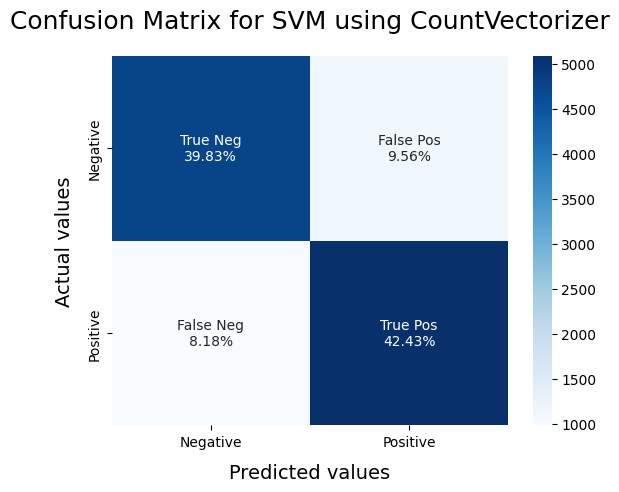

In [ ]:
from sklearn.svm import SVC, LinearSVC
# Using LinearSVC
clf_svm = LinearSVC(random_state=0, tol=1e-5)
clf_svm.fit(X_train, y_train.ravel())

from sklearn.svm import SVC, LinearSVC

# Using LinearSVC
clf = LinearSVC(random_state=0, tol=1e-5)
clf.fit(X_train, y_train.ravel())

# Make predictions
predictions = clf_svm.predict(X_test)

# Model Evaluation
print('Result of SVM using CountVectorizer\n')
print(classification_report(predictions, y_test))
print('\n')
print('Accuracy score: ', accuracy_score(predictions, y_test))
print('\n\n')

# Compute and plot the Confusion matrix using seaborn
cf_matrix = confusion_matrix(y_test, predictions)

categories = ['Negative', 'Positive']
group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]

labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names, group_percentages)]
labels = np.asarray(labels).reshape(2, 2)

sns.heatmap(cf_matrix, annot=labels, cmap='Blues', fmt='',
            xticklabels=categories, yticklabels=categories)

plt.xlabel("Predicted values", fontdict={'size': 14}, labelpad=10)
plt.ylabel("Actual values", fontdict={'size': 14}, labelpad=10)
plt.title("Confusion Matrix for SVM using CountVectorizer", fontdict={'size': 18}, pad=20)
plt.show()


In [ ]:
total_runtime = time.time() - start_time
print(f"Total runtime: {total_runtime:.2f} seconds")

Total runtime: 1760.27 seconds


**SVM using TFIDFVectorizer**

In [ ]:
start_time = time.time()

In [ ]:
label_csv_path = f"{gdrive_path}merged_reviews.csv"
df.to_csv(label_csv_path, index=False)
df=pd.read_csv(label_csv_path)
df.head()

,review,sentiment,label
0,One of the other reviewers has mentioned that ...,positive,1
1,A wonderful little production. <br /><br />The...,positive,1
2,I thought this was a wonderful way to spend ti...,positive,1
3,Basically there's a family where a little boy ...,negative,0
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive,1


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vec = TfidfVectorizer(
    analyzer=preprocess,
    min_df=2,
    max_df=0.9,
    sublinear_tf=True,
    use_idf=True
)


print("Fitting TFIDFVectorizer...")
tfidf_model = tfidf_vec.fit(df['review'])
print("Transforming data...")
train_vec = tfidf_vec.transform(df['review'])
print("TFIDFVectorizer completed.")


Fitting TFIDFVectorizer...
Transforming data...
TFIDFVectorizer completed.


In [ ]:
import pickle

#save vectorizer
tfidf_vectorizer_file = f"{gdrive_path}tfidf_vectorizer.sav"
pickle.dump(tfidf_model, open(tfidf_vectorizer_file, 'wb'))

In [ ]:
#Train Test Split
from sklearn.model_selection import train_test_split
SEED = 4000

X_train, X_test, y_train, y_test = train_test_split(train_vec,
                                            df.label, test_size=0.2, random_state=SEED)


print('X_train shape: {}'.format(X_train.shape))
print('X_test shape: {}'.format(X_test.shape))
print('y_train shape: {}'.format(y_train.shape))
print('y_test shape: {}'.format(y_test.shape))

X_train shape: (48000, 42747)
X_test shape: (12000, 42747)
y_train shape: (48000,)
y_test shape: (12000,)


Result of SVM using TFIDF

              precision    recall  f1-score   support

           0       0.85      0.86      0.86      5897
           1       0.86      0.86      0.86      6103

    accuracy                           0.86     12000
   macro avg       0.86      0.86      0.86     12000
weighted avg       0.86      0.86      0.86     12000



Accuracy score:  0.859


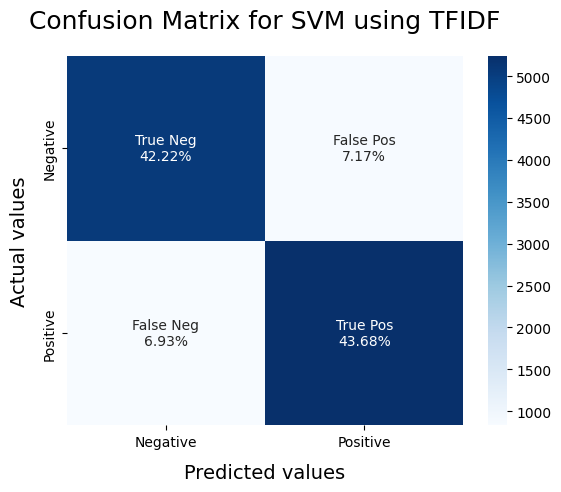

In [ ]:
from sklearn.svm import SVC, LinearSVC
# Using LinearSVC
clf_svm = LinearSVC(random_state=0, tol=1e-5)
clf_svm.fit(X_train, y_train.ravel())

# Make predictions
predictions = clf_svm.predict(X_test)

# Print other metrics
print('Result of SVM using TFIDF\n')
print(classification_report(predictions, y_test))
print('\n')
print('Accuracy score: ', accuracy_score(predictions, y_test))

# Compute and plot the Confusion matrix using seaborn
cf_matrix = confusion_matrix(y_test, predictions)

categories = ['Negative', 'Positive']
group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]

labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names, group_percentages)]
labels = np.asarray(labels).reshape(2, 2)

sns.heatmap(cf_matrix, annot=labels, cmap='Blues', fmt='',
            xticklabels=categories, yticklabels=categories)

plt.xlabel("Predicted values", fontdict={'size': 14}, labelpad=10)
plt.ylabel("Actual values", fontdict={'size': 14}, labelpad=10)
plt.title("Confusion Matrix for SVM using TFIDF", fontdict={'size': 18}, pad=20)
plt.show()


In [ ]:
total_runtime = time.time() - start_time
print(f"Total runtime: {total_runtime:.2f} seconds")

Total runtime: 1551.04 seconds


**LSTM**

In [ ]:
label_csv_path = f"{gdrive_path}merged_reviews.csv"
df.to_csv(label_csv_path, index=False)
df=pd.read_csv(label_csv_path)
df.head()

,review,sentiment,label
0,One of the other reviewers has mentioned that ...,positive,1
1,A wonderful little production. <br /><br />The...,positive,1
2,I thought this was a wonderful way to spend ti...,positive,1
3,Basically there's a family where a little boy ...,negative,0
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive,1


In [ ]:
%%time
documents = [_text.split() for _text in df.review]

CPU times: user 890 ms, sys: 343 ms, total: 1.23 s
Wall time: 1.23 s


In [ ]:
%%time
tokenizer = Tokenizer()
tokenizer.fit_on_texts(df.review)

CPU times: user 8.69 s, sys: 76.5 ms, total: 8.76 s
Wall time: 8.75 s


In [ ]:
vocab_size = len(tokenizer.word_index) + 1
print("Total words", vocab_size)

Total words 131980


In [ ]:
#LSTM Code
# split data into train and test set
from sklearn.model_selection import train_test_split

X = df['review'].values
y = df['sentiment'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [ ]:
%%time
x_train = pad_sequences(tokenizer.texts_to_sequences(X_train), maxlen=300)
x_test = pad_sequences(tokenizer.texts_to_sequences(X_test), maxlen=300)

CPU times: user 6.06 s, sys: 81.1 ms, total: 6.14 s
Wall time: 6.13 s


In [ ]:
labels = df.sentiment.unique().tolist()
labels.append("neutral")
labels

['positive', 'negative', 'neutral']

In [ ]:
%%time

from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
encoder = LabelEncoder()

# Fit LabelEncoder on combined sentiment classes
encoder.fit(df['sentiment'].tolist())

# Transform y_train and y_test
y_train = encoder.transform(y_train.ravel())
y_test = encoder.transform(y_test.ravel())

# Reshape y_train and y_test
y_train = y_train.reshape(-1, 1)
y_test = y_test.reshape(-1, 1)

print("y_train", y_train.shape)
print("y_test", y_test.shape)
print("x_train", x_train.shape)
print("x_test", x_test.shape)



y_train (48000, 1)
y_test (12000, 1)
x_train (48000, 300)
x_test (12000, 300)
CPU times: user 49.1 ms, sys: 0 ns, total: 49.1 ms
Wall time: 48 ms


**BiLSTM using CBOW**

In [ ]:
start_time = time.time()

In [ ]:
#Create CBoW model
CBoW = gensim.models.Word2Vec(documents, vector_size=300, window= 7 , min_count= 10, workers=8, hs = 1, negative=0)


In [ ]:
words = CBoW.wv.index_to_key
vocab_size_wv = len(words)
print("Vocab size:", vocab_size_wv)

Vocab size: 47203


In [ ]:
embedding_matrix = np.zeros((vocab_size, 300))
for word, i in tokenizer.word_index.items():
  if word in CBoW.wv:
    embedding_matrix[i] = CBoW.wv[word]
print(embedding_matrix.shape)

(131980, 300)


In [ ]:
CBoW_model = Sequential()
CBoW_model.add(Embedding(vocab_size, 300, weights=[embedding_matrix], input_length=300, trainable=False))
CBoW_model.add(Bidirectional(LSTM(30, dropout=0.2, recurrent_dropout=0.2)))
CBoW_model.add(Dense(1, activation='sigmoid'))

CBoW_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 300, 300)          39594000  
                                                                 
 bidirectional (Bidirection  (None, 60)                79440     
 al)                                                             
                                                                 
 dense (Dense)               (None, 1)                 61        
                                                                 
Total params: 39673501 (151.34 MB)
Trainable params: 79501 (310.55 KB)
Non-trainable params: 39594000 (151.04 MB)
_________________________________________________________________


In [ ]:
CBoW_model.compile(loss='binary_crossentropy',
              optimizer="adam",
              metrics=['accuracy'])

In [ ]:
!pip install tensorflow

In [ ]:
from tensorflow.keras.models import save_model

callbacks = [ ReduceLROnPlateau(monitor='val_loss', patience=5, cooldown=0),
              EarlyStopping(monitor='val_accuracy', min_delta=1e-4, patience=5)] #change 'val_acc' to 'val_accuracy'

bilstm_cbow = CBoW_model.fit(x_train, y_train,
                    batch_size=1024,
                    epochs=50,
                    validation_split=0.1,
                    verbose=1,
                    callbacks=callbacks)


Epoch 1/50
43/43 [==============================] - 120s 3s/step - loss: 0.6297 - accuracy: 0.6435 - val_loss: 0.5111 - val_accuracy: 0.7504 - lr: 0.0010
Epoch 2/50
43/43 [==============================] - 81s 2s/step - loss: 0.4759 - accuracy: 0.7773 - val_loss: 0.4217 - val_accuracy: 0.8179 - lr: 0.0010
Epoch 3/50
43/43 [==============================] - 79s 2s/step - loss: 0.4150 - accuracy: 0.8157 - val_loss: 0.3937 - val_accuracy: 0.8329 - lr: 0.0010
Epoch 4/50
43/43 [==============================] - 78s 2s/step - loss: 0.3940 - accuracy: 0.8299 - val_loss: 0.4500 - val_accuracy: 0.7958 - lr: 0.0010
Epoch 5/50
43/43 [==============================] - 77s 2s/step - loss: 0.4021 - accuracy: 0.8247 - val_loss: 0.3867 - val_accuracy: 0.8367 - lr: 0.0010
Epoch 6/50
43/43 [==============================] - 76s 2s/step - loss: 0.3671 - accuracy: 0.8438 - val_loss: 0.3577 - val_accuracy: 0.8533 - lr: 0.0010
Epoch 7/50
43/43 [==============================] - 77s 2s/step - loss: 0.3547 - 

In [ ]:
%%time
score = CBoW_model.evaluate(x_test, y_test, batch_size=1024)
print()
print("ACCURACY:",score[1])
print("LOSS:",score[0])

12/12 [==============================] - 4s 298ms/step - loss: 0.3097 - accuracy: 0.8792

ACCURACY: 0.8791666626930237
LOSS: 0.3097270131111145
CPU times: user 3.06 s, sys: 55.5 ms, total: 3.11 s
Wall time: 3.71 s


375/375 [==============================] - 88s 233ms/step
Result of BiLSTM using CBOW

              precision    recall  f1-score   support

           0       0.87      0.88      0.88      5878
           1       0.88      0.88      0.88      6122

    accuracy                           0.88     12000
   macro avg       0.88      0.88      0.88     12000
weighted avg       0.88      0.88      0.88     12000



Accuracy score:  0.8791666666666667


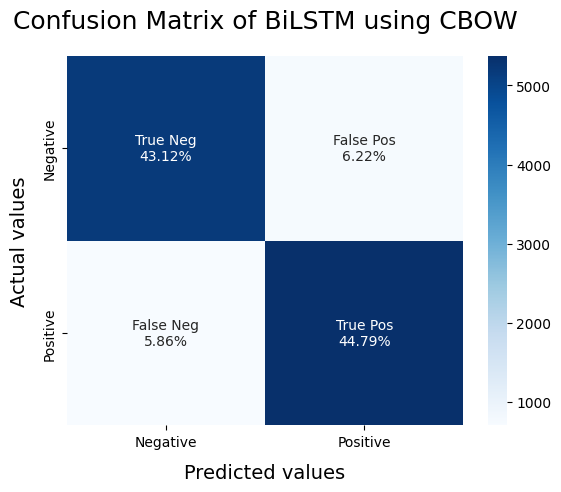

In [ ]:
# Make predictions
bilstm_predictions = CBoW_model.predict(x_test)
bilstm_predictions = np.where(bilstm_predictions >= 0.5, 1, 0).flatten()

# Print other metrics
print('Result of BiLSTM using CBOW\n')
print(classification_report(bilstm_predictions, y_test))
print('\n')
print('Accuracy score: ', accuracy_score(bilstm_predictions, y_test))

# Compute and plot the Confusion matrix using seaborn
cf_matrix_bilstm = confusion_matrix(y_test, bilstm_predictions)

categories_bilstm = ['Negative', 'Positive']
group_names_bilstm = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
group_percentages_bilstm = ['{0:.2%}'.format(value) for value in cf_matrix_bilstm.flatten() / np.sum(cf_matrix_bilstm)]

labels_bilstm = [f'{v1}\n{v2}' for v1, v2 in zip(group_names_bilstm, group_percentages_bilstm)]
labels_bilstm = np.asarray(labels_bilstm).reshape(2, 2)

sns.heatmap(cf_matrix_bilstm, annot=labels_bilstm, cmap='Blues', fmt='',
            xticklabels=categories_bilstm, yticklabels=categories_bilstm)

plt.xlabel("Predicted values", fontdict={'size': 14}, labelpad=10)
plt.ylabel("Actual values", fontdict={'size': 14}, labelpad=10)
plt.title("Confusion Matrix of BiLSTM using CBOW", fontdict={'size': 18}, pad=20)
plt.show()


In [ ]:
encoder = LabelEncoder()
encoder.fit(df.sentiment.tolist())

LabelEncoder()

In [ ]:
# EXPORT
KERAS_MODEL = "CBOW_Sentiment_bilstm.sav"
CBOW_MODEL = "CBOW_model.w2v"
TOKENIZER_MODEL = "CBOW_bilstm_tokenizer.pkl"
ENCODER_MODEL = "CBOW_encoder.pkl"

import pickle

CBoW_model.save(f"{gdrive_path}{KERAS_MODEL}")
CBoW.save(f"{gdrive_path}{CBOW_MODEL}")
pickle.dump(tokenizer, open(f"{gdrive_path}{TOKENIZER_MODEL}", "wb"), protocol=0)
pickle.dump(encoder, open(f"{gdrive_path}{ENCODER_MODEL}", "wb"), protocol=0)
print("All files are saved")

All files are saved


In [ ]:
total_runtime = time.time() - start_time
print(f"Total runtime: {total_runtime:.2f} seconds")

Total runtime: 3292.54 seconds


**BiLSTM using SkipGram**

In [ ]:
start_time = time.time()

In [ ]:
# Create Skip Gram model
skipgram = gensim.models.Word2Vec(documents, min_count = 10, vector_size = 300, window = 7, sg = 1, hs = 1, negative=0)

In [ ]:
words = skipgram.wv.index_to_key
vocab_size_wv = len(words)
print("Vocab size:", vocab_size_wv)

Vocab size: 47203


In [ ]:
embedding_matrix = np.zeros((vocab_size, 300))
for word, i in tokenizer.word_index.items():
  if word in skipgram.wv:
    embedding_matrix[i] = skipgram.wv[word]
print(embedding_matrix.shape)

(131980, 300)


In [ ]:
SkipGram_model = Sequential()
SkipGram_model.add(Embedding(vocab_size, 300, weights=[embedding_matrix], input_length=300, trainable=False))
SkipGram_model.add(Bidirectional(LSTM(30, dropout=0.2, recurrent_dropout=0.2)))
SkipGram_model.add(Dense(1, activation='sigmoid'))

SkipGram_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 300, 300)          39594000  
                                                                 
 bidirectional (Bidirection  (None, 60)                79440     
 al)                                                             
                                                                 
 dense (Dense)               (None, 1)                 61        
                                                                 
Total params: 39673501 (151.34 MB)
Trainable params: 79501 (310.55 KB)
Non-trainable params: 39594000 (151.04 MB)
_________________________________________________________________


In [ ]:
SkipGram_model.compile(loss='binary_crossentropy',
              optimizer="adam",
              metrics=['accuracy'])

In [ ]:
callbacks = [ ReduceLROnPlateau(monitor='val_loss', patience=5, cooldown=0),
              EarlyStopping(monitor='val_accuracy', min_delta=1e-4, patience=5)] #change 'val_acc' to 'val_accuracy'

In [ ]:

history = SkipGram_model.fit(x_train, y_train,
                    batch_size=1024,
                    epochs=50,
                    validation_split=0.1,
                    verbose=1,
                    callbacks=callbacks)

Epoch 1/50
43/43 [==============================] - 66s 1s/step - loss: 0.6141 - accuracy: 0.6702 - val_loss: 0.5145 - val_accuracy: 0.7567 - lr: 0.0010
Epoch 2/50
43/43 [==============================] - 58s 1s/step - loss: 0.4425 - accuracy: 0.8040 - val_loss: 0.4082 - val_accuracy: 0.8219 - lr: 0.0010
Epoch 3/50
43/43 [==============================] - 57s 1s/step - loss: 0.3855 - accuracy: 0.8328 - val_loss: 0.3889 - val_accuracy: 0.8319 - lr: 0.0010
Epoch 4/50
43/43 [==============================] - 57s 1s/step - loss: 0.3647 - accuracy: 0.8406 - val_loss: 0.3478 - val_accuracy: 0.8494 - lr: 0.0010
Epoch 5/50
43/43 [==============================] - 58s 1s/step - loss: 0.3546 - accuracy: 0.8465 - val_loss: 0.3331 - val_accuracy: 0.8598 - lr: 0.0010
Epoch 6/50
43/43 [==============================] - 58s 1s/step - loss: 0.3376 - accuracy: 0.8534 - val_loss: 0.3531 - val_accuracy: 0.8490 - lr: 0.0010
Epoch 7/50
43/43 [==============================] - 57s 1s/step - loss: 0.3375 - a

In [ ]:
%%time
score = SkipGram_model.evaluate(x_test, y_test, batch_size=1024)
print()
print("ACCURACY:",score[1])
print("LOSS:",score[0])

12/12 [==============================] - 2s 172ms/step - loss: 0.2975 - accuracy: 0.8789

ACCURACY: 0.8789166808128357
LOSS: 0.29750603437423706
CPU times: user 2.16 s, sys: 13.1 ms, total: 2.17 s
Wall time: 2.14 s


375/375 [==============================] - 60s 159ms/step
Result of BiLSTM using Skipgram

              precision    recall  f1-score   support

           0       0.83      0.92      0.87      5367
           1       0.93      0.85      0.89      6633

    accuracy                           0.88     12000
   macro avg       0.88      0.88      0.88     12000
weighted avg       0.88      0.88      0.88     12000



Accuracy score:  0.8789166666666667


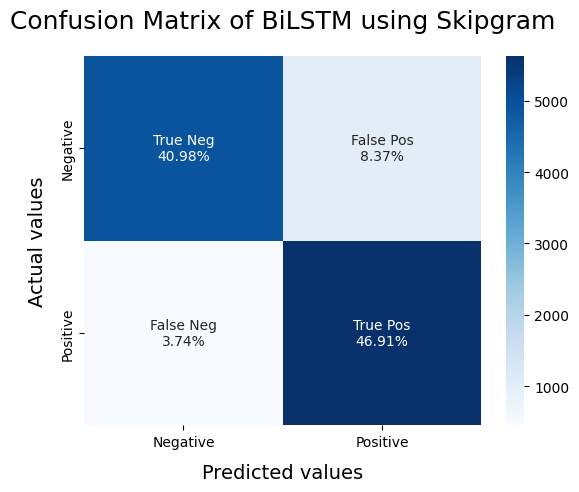

In [ ]:
# Make predictions
bilstm_predictions = SkipGram_model.predict(x_test)
bilstm_predictions = np.where(bilstm_predictions >= 0.5, 1, 0).flatten()

# Print other metrics
print('Result of BiLSTM using Skipgram\n')
print(classification_report(bilstm_predictions, y_test))
print('\n')
print('Accuracy score: ', accuracy_score(bilstm_predictions, y_test))

# Compute and plot the Confusion matrix using seaborn
cf_matrix_bilstm = confusion_matrix(y_test, bilstm_predictions)

categories_bilstm = ['Negative', 'Positive']
group_names_bilstm = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
group_percentages_bilstm = ['{0:.2%}'.format(value) for value in cf_matrix_bilstm.flatten() / np.sum(cf_matrix_bilstm)]

labels_bilstm = [f'{v1}\n{v2}' for v1, v2 in zip(group_names_bilstm, group_percentages_bilstm)]
labels_bilstm = np.asarray(labels_bilstm).reshape(2, 2)

sns.heatmap(cf_matrix_bilstm, annot=labels_bilstm, cmap='Blues', fmt='',
            xticklabels=categories_bilstm, yticklabels=categories_bilstm)

plt.xlabel("Predicted values", fontdict={'size': 14}, labelpad=10)
plt.ylabel("Actual values", fontdict={'size': 14}, labelpad=10)
plt.title("Confusion Matrix of BiLSTM using Skipgram", fontdict={'size': 18}, pad=20)
plt.show()


In [ ]:
#Export
KERAS_MODEL2 = "Skipgram_Sentiment_bilstm.sav"
SKIPGRAM_MODEL2 = "Skipgram_model.w2v"
TOKENIZER_MODEL2 = "Skipgram_bilstm_tokenizer.pkl"
ENCODER_MODEL2 = "Skipgram_encoder.pkl"

import pickle

SkipGram_model.save(f"{gdrive_path}{KERAS_MODEL2}")
skipgram.save(f"{gdrive_path}{SKIPGRAM_MODEL2}")
pickle.dump(tokenizer, open(f"{gdrive_path}{TOKENIZER_MODEL2}", "wb"), protocol=0)
pickle.dump(encoder, open(f"{gdrive_path}{ENCODER_MODEL2}", "wb"), protocol=0)
print("All files are saved")

All files are saved


In [ ]:
total_runtime = time.time() - start_time
print(f"Total runtime: {total_runtime:.2f} seconds")

Total runtime: 2139.17 seconds


**Aspect Extraction**

In [ ]:
df = pd.read_excel(f"{gdrive_path}Coffee_shops_reviews_with_Sentiment.xlsx")
df.head()

,state,title,categoryName,stars,review,sentiment,label
0,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,3,Long waiting time even at no rush hour. Wait f...,negative,0
1,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,4,Nice place for a hangout and have a sip of cof...,positive,1
2,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,5,A hidden gem in Chinatown Kuala Terengganu. Co...,positive,1
3,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,3,"Balek Kg Cina, discovered this cafe from my fr...",negative,0
4,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,5,Was walking to search for this Hidden Cafe and...,positive,1


In [ ]:
import os

# Initialize variables
cleaned_text = []
counter = 1
sentence_count=0

# Process rows and print a message every 10000 rows
for index, text in enumerate(df["review"], start=1):
    cleaned_text.append(preprocess(str(text)))

    if index % 1000 == 0:
        print(f'Preprocessing done for {index} rows.')

#add preprocessed text as a new column
df["Clean"] = cleaned_text
df = df.dropna()

#Save the preprocessed data to a CSV file in Google Drive
excel_file_path =f"{gdrive_path}preprocessed_reviews.xlsx"

# Check if the file already exists, and delete it if it does
if os.path.exists(excel_file_path):
    os.remove(excel_file_path)
    print(f'Previous file removed: {excel_file_path}')

# Save the new preprocessed data to the CSV file
df.to_excel(excel_file_path, index=False)

print(f'Preprocessed data saved to {excel_file_path}')
print('Preprocessing done.')


Preprocessing done for 1000 rows.
Preprocessing done for 2000 rows.
Preprocessing done for 3000 rows.
Preprocessing done for 4000 rows.
Preprocessing done for 5000 rows.
Preprocessing done for 6000 rows.
Preprocessing done for 7000 rows.
Preprocessing done for 8000 rows.
Preprocessing done for 9000 rows.
Preprocessing done for 10000 rows.
Preprocessing done for 11000 rows.
Preprocessing done for 12000 rows.
Preprocessing done for 13000 rows.
Preprocessing done for 14000 rows.
Preprocessing done for 15000 rows.
Preprocessing done for 16000 rows.
Preprocessing done for 17000 rows.
Preprocessing done for 18000 rows.
Preprocessing done for 19000 rows.
Preprocessing done for 20000 rows.
Preprocessing done for 21000 rows.
Preprocessing done for 22000 rows.
Preprocessing done for 23000 rows.
Preprocessing done for 24000 rows.
Preprocessing done for 25000 rows.
Preprocessing done for 26000 rows.
Preprocessing done for 27000 rows.
Preprocessing done for 28000 rows.
Preprocessing done for 29000 

**LDA**

In [ ]:
start_time = time.time()

In [ ]:
df = pd.read_excel(f"{gdrive_path}preprocessed_reviews.xlsx")
df.head()

,state,title,categoryName,stars,review,sentiment,label,Clean
0,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,3,Long waiting time even at no rush hour. Wait f...,negative,0,"['long', 'wait', 'time', 'even', 'rush', 'hour..."
1,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,4,Nice place for a hangout and have a sip of cof...,positive,1,"['nice', 'place', 'hangout', 'coffee', 'inside..."
2,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,5,A hidden gem in Chinatown Kuala Terengganu. Co...,positive,1,"['hide', 'gem', 'chinatown', 'cool', 'atmosphe..."
3,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,3,"Balek Kg Cina, discovered this cafe from my fr...",negative,0,"['discover', 'friend', 'order', 'chocolate', '..."
4,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,5,Was walking to search for this Hidden Cafe and...,positive,1,"['walk', 'search', 'hide', 'cafe', 'start', 'r..."


In [ ]:
#LDA model training

import gensim.corpora as corpora
import gensim.models as models

from ast import literal_eval
from pprint import pprint

data_words = []
for x in df['Clean']:
    data_words.append(literal_eval(x))

# Create Dictionary
id2word = corpora.Dictionary(data_words)

# Create Corpus
texts = data_words

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# number of topics
num_topics = 50
num_words = 10

# Build LDA model
lda_model1 =models.LdaMulticore(corpus=corpus,
                              id2word=id2word,
                              num_topics=num_topics)



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


In [ ]:
#save LDA Model
import pickle
topics = lda_model1.print_topics(num_topics=num_topics, num_words=num_words)
topic_list = []
for topic in topics:
  topic_list.append(topic[1])

#save LDA topics
df_topics = pd.DataFrame(topic_list,  columns =['topics'])
df_topics.to_csv(f"{gdrive_path}LDA_topics.csv")

#save LDA model
pickle.dump(lda_model1, open(f"{gdrive_path}LDA_model.model",'wb'))

#save dictionary
pickle.dump(id2word, open(f"{gdrive_path}LDA_model.dict",'wb'))

#save corpus
pickle.dump(corpus, open(f"{gdrive_path}LDA_model.corpus",'wb'))


In [ ]:
lda_topics = lda_model1.print_topics()
for i, topic in enumerate(lda_topics):
    print(topic)
    if (i + 1) % 5 == 0:
        print("\n")  # Add a newline after every 5 pairs

(16, '0.046*"coffee" + 0.046*"place" + 0.044*"nice" + 0.019*"come" + 0.018*"good" + 0.014*"food" + 0.013*"great" + 0.011*"love" + 0.011*"cake" + 0.010*"friend"')
(1, '0.034*"food" + 0.021*"good" + 0.020*"nice" + 0.020*"coffee" + 0.015*"service" + 0.014*"place" + 0.011*"order" + 0.010*"really" + 0.009*"try" + 0.009*"big"')
(31, '0.025*"good" + 0.017*"food" + 0.017*"cream" + 0.015*"taste" + 0.014*"coffee" + 0.014*"ice" + 0.014*"try" + 0.013*"order" + 0.012*"time" + 0.009*"go"')
(36, '0.027*"good" + 0.017*"nice" + 0.014*"place" + 0.013*"coffee" + 0.012*"food" + 0.011*"taste" + 0.011*"cake" + 0.010*"also" + 0.010*"cafe" + 0.009*"order"')
(39, '0.035*"coffee" + 0.015*"good" + 0.015*"food" + 0.012*"try" + 0.012*"order" + 0.012*"drink" + 0.012*"place" + 0.011*"nice" + 0.009*"great" + 0.008*"staff"')


(9, '0.036*"good" + 0.028*"food" + 0.022*"coffee" + 0.020*"service" + 0.017*"great" + 0.017*"cake" + 0.013*"staff" + 0.013*"order" + 0.013*"place" + 0.012*"nice"')
(14, '0.036*"food" + 0.027*"pl

In [ ]:
import pickle

#define lda file path for model, dictionary, corpus
lda_model_file = f"{gdrive_path}LDA_model.model"
lda_dict_file = f"{gdrive_path}LDA_model.dict"
lda_corpus_file =f"{gdrive_path}LDA_model.corpus"

#load trained model, dictionary, corpus
loaded_lda_model = pickle.load(open(lda_model_file, 'rb'))
loaded_dictionary = pickle.load(open(lda_dict_file, 'rb'))
loaded_corpus= pickle.load(open(lda_corpus_file, 'rb'))

In [ ]:
!pip install --upgrade pyLDAvis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 10.4 MB/s eta 0:00:00


In [ ]:
import pyLDAvis
from pyLDAvis import gensim_models as gensimvis

pyLDAvis.enable_notebook()
# Prepare the visualization
vis_data = gensimvis.prepare(loaded_lda_model, loaded_corpus, loaded_dictionary)

# Display the visualization
pyLDAvis.display(vis_data)



/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


In [ ]:
total_runtime = time.time() - start_time
print(f"Total runtime: {total_runtime:.2f} seconds")

Total runtime: 80.45 seconds


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


**BerTopic**


In [ ]:
!pip install bertopic

In [ ]:
start_time=time.time()

In [ ]:
import pandas as pd
csv_file_path =f"{gdrive_path}preprocessed_reviews.xlsx"
df = pd.read_excel(csv_file_path)

In [ ]:
#Prepare data for training
from ast import literal_eval

data_words = []
for x in df['Clean']:
    data_words.append(' '.join(literal_eval(x)))

In [ ]:
#Train BERTopic
from bertopic import BERTopic

bertopic_model = BERTopic(language="english", verbose=True)
topics, probs = bertopic_model.fit_transform(data_words)

2024-05-04 15:08:33,928 - BERTopic - Embedding - Transforming documents to embeddings.


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/3124 [00:00<?, ?it/s]

2024-05-04 15:09:08,922 - BERTopic - Embedding - Completed ✓
2024-05-04 15:09:08,924 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-05-04 15:11:16,241 - BERTopic - Dimensionality - Completed ✓
2024-05-04 15:11:16,245 - BERTopic - Cluster - Start clustering the reduced embeddings
/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()
2024-05-04 15:11:24,973 - BERTopic - Cluster - Completed ✓
2024-05-04 15:11:25,004 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-05-04 15:11:28,519 - BERTopic - Representation - Completed ✓


In [ ]:
import pickle

bertopic_model.get_topic_info().head(100).to_csv(f'{gdrive_path}BERT_topics.csv')
pickle.dump(bertopic_model, open(f'{gdrive_path}BERTopic_model.model', 'wb'))
bertopic_model.save(f'{gdrive_path}BERTopic_model.model')


/usr/local/lib/python3.10/dist-packages/scipy/sparse/_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
2024-05-04 15:11:53,801 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


In [ ]:
# Extracting Topics
freq = bertopic_model.get_topic_info();
freq.head(5)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,44358,-1_cake_taste_try_time,"[cake, taste, try, time, cafe, order, get, go,...",[look brunch area find cafe look hipst cafe ou...
1,0,4052,0_mood_ninety_aka_aaa,"[mood, ninety, aka, aaa, donat, goo, hahahah, ...","[, goo, good food good mood]"
2,1,1170,1_rude_ask_tell_customer,"[rude, ask, tell, customer, table, cashier, wa...",[food taste normal order burger shakshuka port...
3,2,978,2_pastry_au_pain_flaky,"[pastry, au, pain, flaky, bakery, tart, select...","[nice pastry good coffee, pastry, good coffee ..."
4,3,582,3_good_mee_gilerrr_muchhhh,"[good, mee, gilerrr, muchhhh, aor, ye, bro, as...","[good, good, good]"


In [ ]:
# Select the most frequent topic
bertopic_model.get_topic(0)

[('mood', 0.32472238069737724),
 ('ninety', 0.15849994559244543),
 ('aka', 0.1503145040095723),
 ('aaa', 0.1431144172074694),
 ('donat', 0.13412180961166126),
 ('goo', 0.12280554299097875),
 ('hahahah', 0.11877163865249316),
 ('guy', 0.01913516970804953),
 ('last', 0.016708277034949506),
 ('bring', 0.014439824661019906)]

In [ ]:
# Attributes
bertopic_model.topics_[:10]

[-1, -1, 86, -1, -1, -1, -1, 120, 86, -1]

In [ ]:
#Visualize Topics
bertopic_model.visualize_topics()

In [ ]:
#Visualize Topic Hierarchy
bertopic_model.visualize_hierarchy(top_n_topics=50)

In [ ]:
#Visualize Terms
bertopic_model.visualize_barchart(top_n_topics=8)

**CorEx**

In [ ]:
!pip install corextopic

In [ ]:
#read the reviews
import pandas as pd
df = pd.read_excel(f"{gdrive_path}preprocessed_reviews.xlsx")
df = df.dropna()
df

,state,title,categoryName,stars,review,sentiment,label,Clean
0,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,3,Long waiting time even at no rush hour. Wait f...,negative,0,"['long', 'wait', 'time', 'even', 'rush', 'hour..."
1,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,4,Nice place for a hangout and have a sip of cof...,positive,1,"['nice', 'place', 'hangout', 'coffee', 'inside..."
2,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,5,A hidden gem in Chinatown Kuala Terengganu. Co...,positive,1,"['hide', 'gem', 'chinatown', 'cool', 'atmosphe..."
3,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,3,"Balek Kg Cina, discovered this cafe from my fr...",negative,0,"['discover', 'friend', 'order', 'chocolate', '..."
4,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,5,Was walking to search for this Hidden Cafe and...,positive,1,"['walk', 'search', 'hide', 'cafe', 'start', 'r..."
...,...,...,...,...,...,...,...,...
99957,Selangor,Empty Cup Coffee Roastery,Cafe,5,Good piccolo latte,positive,1,"['good', 'piccolo', 'latte']"
99958,Selangor,Empty Cup Coffee Roastery,Cafe,5,那里的美食真好吃,positive,1,['那里的美食真好吃']
99959,Selangor,Empty Cup Coffee Roastery,Cafe,3,Gud taste,negative,0,['taste']
99960,Selangor,Empty Cup Coffee Roastery,Cafe,4,Good hợp khẩu vị,positive,1,[]


In [ ]:
#Training semi-supervised Anchored COREX model
import numpy as np
import scipy.sparse as ss
import pickle
from corextopic import corextopic as ct
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
from ast import literal_eval

data_anchored_corex = pd.read_excel(f"{gdrive_path}preprocessed_reviews.xlsx")
train_topics = pd.read_excel(f"{gdrive_path}Training_topics_corex.xlsx")
df_anchored_corex = pd.DataFrame()

data_words_anchored_corex = []
for x in data_anchored_corex['Clean']:
    data_words_anchored_corex.append(' '.join(literal_eval(x)))
keywords = []
for x in train_topics['Key']:
    keywords.append(literal_eval(x))

vectorizer_anchored_corex = CountVectorizer(stop_words='english', max_features=20000, binary=True)

doc_word_anchored_corex = vectorizer_anchored_corex.fit_transform(data_words_anchored_corex)
doc_word_anchored_corex = ss.csr_matrix(doc_word_anchored_corex)

words = vectorizer_anchored_corex.get_feature_names_out()

# Train the CorEx topic model with 10 topics
topic_model_anchored_corex = ct.Corex(n_hidden=10, words=words, max_iter=1000, verbose=False, seed=2022)
topic_model_anchored_corex.fit(doc_word_anchored_corex, words=words, anchors=keywords, anchor_strength=3)

#Save the model and topics
pickle.dump(topic_model_anchored_corex, open(f"{gdrive_path}Anchored_CorEx_Train_model.sav", 'wb'))
topic_list_anchored_corex = topic_model_anchored_corex.get_topics()

df_anchored_corex['Topics'] = topic_list_anchored_corex
df_anchored_corex.to_excel(f"{gdrive_path}Anchored_CorEx_topics_final.xlsx")

In [ ]:
# Print all topics from the CorEx topic model
anchored_corex_topics = topic_model_anchored_corex.get_topics()
for n,topic in enumerate(anchored_corex_topics):
    topic_words,_,_ = zip(*topic)
    print('{}: '.format(n) + ', '.join(topic_words))

0: coffee, latte, strong, cappuccino, espresso, mocha, good, bean, shop, shot
1: friendly, environment, atmosphere, vibe, relax, space, clean, comfortable, cosy, interior
2: price, reasonable, expensive, pricey, affordable, cost, overprice, reasonably, high, rm
3: service, staff, friendly, helpful, attentive, slow, waiter, waitress, food, efficient
4: parking, space, hard, limit, park, easy, car, problem, challenge, private
5: cake, dessert, cream, bread, croissant, waffle, cheesecake, pancake, egg, snack
6: table, seat, order, seating, outdoor, wait, time, indoor, chair, customer
7: environment, ambiance, wifi, decoration, toilet, facility, restroom, speed, connection, digital
8: quiet, music, busy, cafe, noisy, place, loud, look, feel, area
9: come, make, pet, experience, visit, menu, really, definitely, dog, drink


In [ ]:
#label the review with topics
import pandas as pd
import pickle
from ast import literal_eval

data = pd.read_excel(f"{gdrive_path}preprocessed_reviews.xlsx")
aspect_list = [[],[],[],[],[],[],[],[],[],[]]
words_set = []
for x in data['Clean']:
    words_set.append(set(literal_eval(x)))

model = pickle.load(open(f"{gdrive_path}Anchored_CorEx_Train_model.sav", 'rb'))
topic_list = []
for i, topic_words in enumerate(model.get_topics()):
  topic_list.append(set([words[0] for words in topic_words if words[1] > 0]))

for words in words_set:
    for i, topic_words in enumerate(topic_list):
        if i < len(aspect_list):  # Check if the index is within the range of aspect_list
            if (words & topic_words):
                aspect_list[i].append(1)
            else:
                aspect_list[i].append(0)

for i in range(10):
  data['Topic ' + str(i)] = aspect_list[i]
data.to_excel(f"{gdrive_path}labelled_aspect.xlsx")

In [ ]:
#read the reviews
import pandas as pd
df = pd.read_excel(f"{gdrive_path}labelled_aspect.xlsx")
df = df.dropna()
df

,Unnamed: 0,state,title,categoryName,stars,review,sentiment,label,Clean,Topic 0,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9
0,0,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,3,Long waiting time even at no rush hour. Wait f...,negative,0,"['long', 'wait', 'time', 'even', 'rush', 'hour...",1,1,1,1,0,1,1,1,0,1
1,1,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,4,Nice place for a hangout and have a sip of cof...,positive,1,"['nice', 'place', 'hangout', 'coffee', 'inside...",1,0,0,0,0,0,1,0,1,1
2,2,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,5,A hidden gem in Chinatown Kuala Terengganu. Co...,positive,1,"['hide', 'gem', 'chinatown', 'cool', 'atmosphe...",1,1,0,0,0,0,1,0,0,0
3,3,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,3,"Balek Kg Cina, discovered this cafe from my fr...",negative,0,"['discover', 'friend', 'order', 'chocolate', '...",0,0,0,0,0,0,1,0,0,1
4,4,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,5,Was walking to search for this Hidden Cafe and...,positive,1,"['walk', 'search', 'hide', 'cafe', 'start', 'r...",0,1,0,1,0,0,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99957,99957,Selangor,Empty Cup Coffee Roastery,Cafe,5,Good piccolo latte,positive,1,"['good', 'piccolo', 'latte']",1,0,0,0,0,0,0,0,0,0
99958,99958,Selangor,Empty Cup Coffee Roastery,Cafe,5,那里的美食真好吃,positive,1,['那里的美食真好吃'],0,0,0,0,0,0,0,0,0,0
99959,99959,Selangor,Empty Cup Coffee Roastery,Cafe,3,Gud taste,negative,0,['taste'],0,0,0,0,0,0,0,0,0,0
99960,99960,Selangor,Empty Cup Coffee Roastery,Cafe,4,Good hợp khẩu vị,positive,1,[],0,0,0,0,0,0,0,0,0,0


In [ ]:
import pickle
from tensorflow.keras.models import load_model

gdrive_path_sentiment_analysis = '/content/drive/MyDrive/Thesis2/'

loaded_bilstm_model = load_model(f"{gdrive_path_sentiment_analysis}CBOW_Sentiment_bilstm.sav")

loaded_tokenizer = pickle.load(open(f'{gdrive_path_sentiment_analysis}CBOW_bilstm_tokenizer.pkl', 'rb'))

In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
clean_sentence = df['Clean'].astype(str).values

loaded_tokenizer.fit_on_texts(data.Clean.astype(str))
x_test = pad_sequences(loaded_tokenizer.texts_to_sequences(clean_sentence), maxlen=300)

In [ ]:
# Predict using the trained model (CBoW_model)
score = loaded_bilstm_model.predict([x_test])

3124/3124 [==============================] - 269s 86ms/step


In [ ]:
label = []
for i in score:
  if i>0.5:
    label.append('Positive')
  else:
    label.append('Negative')

df['Score'] = score
df["Sentiment"] = label
df

,Unnamed: 0,state,title,categoryName,stars,review,sentiment,label,Clean,Topic 0,...,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Score,Sentiment
0,0,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,3,Long waiting time even at no rush hour. Wait f...,negative,0,"['long', 'wait', 'time', 'even', 'rush', 'hour...",1,...,1,1,0,1,1,1,0,1,0.049980,Negative
1,1,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,4,Nice place for a hangout and have a sip of cof...,positive,1,"['nice', 'place', 'hangout', 'coffee', 'inside...",1,...,0,0,0,0,1,0,1,1,0.535264,Positive
2,2,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,5,A hidden gem in Chinatown Kuala Terengganu. Co...,positive,1,"['hide', 'gem', 'chinatown', 'cool', 'atmosphe...",1,...,0,0,0,0,1,0,0,0,0.216768,Negative
3,3,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,3,"Balek Kg Cina, discovered this cafe from my fr...",negative,0,"['discover', 'friend', 'order', 'chocolate', '...",0,...,0,0,0,0,1,0,0,1,0.152199,Negative
4,4,terengganu,Hidden cafe @ suite18hiddencafe,Cafe,5,Was walking to search for this Hidden Cafe and...,positive,1,"['walk', 'search', 'hide', 'cafe', 'start', 'r...",0,...,0,1,0,0,1,0,1,1,0.810763,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99957,99957,Selangor,Empty Cup Coffee Roastery,Cafe,5,Good piccolo latte,positive,1,"['good', 'piccolo', 'latte']",1,...,0,0,0,0,0,0,0,0,0.463735,Negative
99958,99958,Selangor,Empty Cup Coffee Roastery,Cafe,5,那里的美食真好吃,positive,1,['那里的美食真好吃'],0,...,0,0,0,0,0,0,0,0,0.534294,Positive
99959,99959,Selangor,Empty Cup Coffee Roastery,Cafe,3,Gud taste,negative,0,['taste'],0,...,0,0,0,0,0,0,0,0,0.339250,Negative
99960,99960,Selangor,Empty Cup Coffee Roastery,Cafe,4,Good hợp khẩu vị,positive,1,[],0,...,0,0,0,0,0,0,0,0,0.534294,Positive


In [ ]:
df.to_excel(f"{gdrive_path_sentiment_analysis}coffee_shops_reviews_with_score.xlsx", index=False)

In [ ]:
df.drop(df[df['Sentiment'] == 'Negative'].index, inplace=True)

In [ ]:
topics=['Topic 0','Topic 1','Topic 2','Topic 3','Topic 4','Topic 5','Topic 6','Topic 7','Topic 8','Topic 9']

for topic in topics:
  df[topic] = df[topic] * df['Score']

topics_sentiment_analysis = data.groupby('title')[['Topic 0','Topic 1','Topic 2','Topic 3','Topic 4','Topic 5','Topic 6','Topic 7','Topic 8','Topic 9']].var().reset_index()
column_rename={'title': 'Coffee Shops',
               'Topic 0': 'Coffee_type',
               'Topic 1': 'Ambiance',
               'Topic 2': 'Price',
               'Topic 3': 'Service',
               'Topic 4': 'Location',
               'Topic 5': 'Pastry',
               'Topic 6': 'Seating',
               'Topic 7': 'Amenities',
               'Topic 8': 'Noise Level',
               'Topic 9': 'Pet-friendly'
}

topics_sentiment_analysis=topics_sentiment_analysis.rename(columns=column_rename)
topics_sentiment_analysis

,Coffee Shops,Coffee_type,Ambiance,Price,Service,Location,Pastry,Seating,Amenities,Noise Level,Pet-friendly
0,% Arabica Pavilion Kuala Lumpur,0.068183,0.139353,0.242709,0.170290,0.053634,0.053634,0.249231,0.059521,0.228261,0.241460
1,1+3 Coffee House,0.248313,0.255061,0.167341,0.255061,0.133603,0.195682,0.182186,0.207827,0.207827,0.151147
2,10 Kopitiam @Melaka,0.232081,0.125171,0.120616,0.245787,0.048375,0.075990,0.162541,0.054060,0.138354,0.183826
3,103 Coffee,0.139353,0.199287,0.206589,0.217113,0.090301,0.174036,0.229253,0.125574,0.249231,0.249933
4,103 Coffee - Chow Kit,0.134624,0.177396,0.108303,0.250239,0.095448,0.122994,0.192721,0.065209,0.232610,0.249872
...,...,...,...,...,...,...,...,...,...,...,...
594,和平卤肉 Ho Ping Lor Bak,0.333333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
595,居林烧鱼（槟城发林） Kulim Grill Fish (Penang farlim),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
596,日日香豆干粥Dou Gan Zhou(老字号）,0.143678,0.064368,0.033333,0.185057,0.000000,0.000000,0.033333,0.000000,0.033333,0.033333
597,梹城湖内 百年茶室,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
topics = ['Coffee_type', 'Ambiance', 'Price', 'Service', 'Location', 'Pastry', 'Seating', 'Amenities', 'Noise Level', 'Pet-friendly']
print("Below shows the top 5 Coffee Shops based on different topics: \n")

result = pd.DataFrame()

for top_five in topics:
    # Sort the DataFrame by the specified column in descending order
    sorted_df = topics_sentiment_analysis.sort_values(by=top_five, ascending=False)

    # Use head to get the top 5 rows
    top_five_products = sorted_df.head(5).reset_index()

    result[f'{top_five}'] = top_five_products['Coffee Shops']

# Apply styling to left-align the text
styled_result = result.style.set_properties(**{'text-align': 'left'})

# Display the styled DataFrame
styled_result


Below shows the top 5 Coffee Shops based on different topics: 



,Coffee_type,Ambiance,Price,Service,Location,Pastry,Seating,Amenities,Noise Level,Pet-friendly
0,Fat Tiger Kombucha Lab Penang Bazaar,Penang Longest Kopitiam,Sky Hotel Coffee Shop,RF Coffee Penang,RF Coffee Penang,RF Coffee Penang,Penang Longest Kopitiam,Guddtazz Coffee Cafe - GCC,Penang Longest Kopitiam,Penang Longest Kopitiam
1,Penang Longest Kopitiam,Guddtazz Coffee Cafe - GCC,New Li Garden Coffee Shop 麗園茶室,Penang Longest Kopitiam,Penang Longest Kopitiam,Ngopdul Coffee Penang,Nparks Corner Cafe,Bread & Co. Exim Bank KL,Fat Tiger Kombucha Lab Penang Bazaar,Ngopdul Coffee Penang
2,Sky Hotel Coffee Shop,Coffee Shop IT KAR (Selling Famous Kaya),Ngopi PDL (Penang Digital Library),Ngopdul Coffee Penang,Ngopdul Coffee Penang,Coffee Shop IT KAR (Selling Famous Kaya),"Gigi Coffee First Avenue, Penang",Things Coffee,Bread & Co. Exim Bank KL,Ct Coffee & Chocolate Centre
3,和平卤肉 Ho Ping Lor Bak,Bread & Co. Exim Bank KL,Nparks Corner Cafe,Bread & Co. Exim Bank KL,Story Cafe,Croiss x Coffee,Ceylonz Cafe,Ngopi PDL (Penang Digital Library),Coffee Shop IT KAR (Selling Famous Kaya),Sky Hotel Coffee Shop
4,New Li Garden Coffee Shop 麗園茶室,Ngopi PDL (Penang Digital Library),Story Cafe,New Li Garden Coffee Shop 麗園茶室,Ngopi PDL (Penang Digital Library),Coffee House,SPARQ Coffee - KL Eco City Mall,Mito Coffee,Helf Coffee,Guddtazz Coffee Cafe - GCC
